In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

from sklearn.preprocessing import RobustScaler

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.kernel_ridge import KernelRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor


from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_squared_error

In [49]:
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")

In [50]:
df_train.head(n=5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [35]:
csv_df.tail(n=5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [51]:
df_train['DataType'], df_test['DataType'] = 'training', 'testing'
df_test.insert(df_test.shape[1] - 1, 'SalePrice', np.nan)
df_data = pd.concat([df_train, df_test], ignore_index=True)

In [52]:
def countplot(x = None, y = None, data = None, ncols = 5, nrows = 3):
    fig, axes = plt.subplots(figsize=(4*ncols , 3*nrows), ncols=ncols, nrows=nrows)
    axes = axes.flatten()
    for i, v in enumerate(x): sns.countplot(x=v, hue=y, data=data, ax=axes[i])

In [53]:
def boxplot(cat = None, num = None, data = None, ncols = 5, nrows = 3):
    fig, axes = plt.subplots(figsize=(4*ncols , 3*nrows), ncols=ncols, nrows=nrows)
    axes = axes.flatten()
    if type(cat) == list:
        for i, v in enumerate(cat): sns.boxplot(x=v, y=num, data=data, ax=axes[i])
    else:
        for i, v in enumerate(num): sns.boxplot(x=cat, y=v, data=data, ax=axes[i])

In [54]:
def boxplotsort(cat = None, num = None, data = None, ncols = 5, nrows = 3, orderby='median'):
    fig, axes = plt.subplots(figsize=(4*ncols , 3*nrows), ncols=ncols, nrows=nrows)
    axes = axes.flatten()
    if type(cat) == list:
        for i, v in enumerate(cat): sns.boxplot(x=v, y=num, data=data, ax=axes[i], order=data.groupby([v], as_index=True).agg({num: orderby}).sort_values(num).index)
    else:
        for i, v in enumerate(num): sns.boxplot(x=cat, y=v, data=data, ax=axes[i], order=data.groupby([cat], as_index=True).agg({v: orderby}).sort_values(v).index)

In [55]:
def swarmplot(cat = None, num = None, data = None, ncols = 5, nrows = 3):
    fig, axes = plt.subplots(figsize=(4*ncols , 3*nrows), ncols=ncols, nrows=nrows)
    axes = axes.flatten()
    if type(cat) == list:
        for i, v in enumerate(cat): sns.swarmplot(x=v, y=num, data=data, ax=axes[i])
    else:
        for i, v in enumerate(num): sns.swarmplot(x=cat, y=v, data=data, ax=axes[i])

In [56]:
def violinplot(cat = None, num = None, data = None, ncols = 5, nrows = 3):
    fig, axes = plt.subplots(figsize=(4*ncols , 3*nrows), ncols=ncols, nrows=nrows)
    axes = axes.flatten()
    if type(cat) == list:
        for i, v in enumerate(cat): sns.violinplot(x=v, y=num, data=data, ax=axes[i])
    else:
        for i, v in enumerate(num): sns.violinplot(x=cat, y=v, data=data, ax=axes[i])

In [57]:
def violinplotsort(cat = None, num = None, data = None, ncols = 5, nrows = 3, orderby='median'):
    fig, axes = plt.subplots(figsize=(4*ncols , 3*nrows), ncols=ncols, nrows=nrows)
    axes = axes.flatten()
    if type(cat) == list:
        for i, v in enumerate(cat): sns.violinplot(x=v, y=num, data=data, ax=axes[i], order=data.groupby([v], as_index=True).agg({num: orderby}).sort_values(num).index)
    else:
        for i, v in enumerate(num): sns.violinplot(x=cat, y=v, data=data, ax=axes[i], order=data.groupby([cat], as_index=True).agg({v: orderby}).sort_values(v).index)

In [58]:
def scatterplot(x = None, y = None, data = None, ncols = 5, nrows = 3):
    fig, axes = plt.subplots(figsize=(4*ncols , 3*nrows), ncols=ncols, nrows=nrows)
    axes = axes.flatten()
    for i, xi in enumerate(x): sns.scatterplot(x=xi, y=y, data=data, ax=axes[i])

In [59]:
# describe training and testing data
df_data.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,DataType
count,2919.000000,2919.000000,2915,2433.000000,2919.000000,2919,198,2919,2919,2917,...,10,571,105,2919.000000,2919.000000,2919.000000,2918,2919,1460.000000,2919
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,...,3,4,4,NaN,NaN,NaN,9,6,NaN,2
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,...,Ex,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN,training
freq,NaN,NaN,2265,NaN,NaN,2907,120,1859,2622,2916,...,4,329,95,NaN,NaN,NaN,2525,2402,NaN,1460
mean,1460.000000,57.137718,NaN,69.305795,10168.114080,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,50.825968,6.213087,2007.792737,NaN,NaN,180921.195890,NaN
std,842.787043,42.517628,NaN,23.344905,7886.996359,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,567.402211,2.714762,1.314964,NaN,NaN,79442.502883,NaN
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,1.000000,2006.000000,NaN,NaN,34900.000000,NaN
25%,730.500000,20.000000,NaN,59.000000,7478.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,4.000000,2007.000000,NaN,NaN,129975.000000,NaN
50%,1460.000000,50.000000,NaN,68.000000,9453.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,6.000000,2008.000000,NaN,NaN,163000.000000,NaN
75%,2189.500000,70.000000,NaN,80.000000,11570.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,8.000000,2009.000000,NaN,NaN,214000.000000,NaN


In [60]:
# convert dtypes numeric to object
col_convert = ['MSSubClass']
df_data[col_convert] = df_data[col_convert].astype('object')

In [61]:
# list all features type number
col_number = df_data.select_dtypes(include=['number']).columns.tolist()
print('features type number:\n items %s\n length %d' %(col_number, len(col_number)))

# list all features type object
col_object = df_data.select_dtypes(include=['object']).columns.tolist()
print('features type object:\n items %s\n length %d' %(col_object, len(col_object)))

features type number:
 items ['Id', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
 length 37
features type object:
 items ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQu

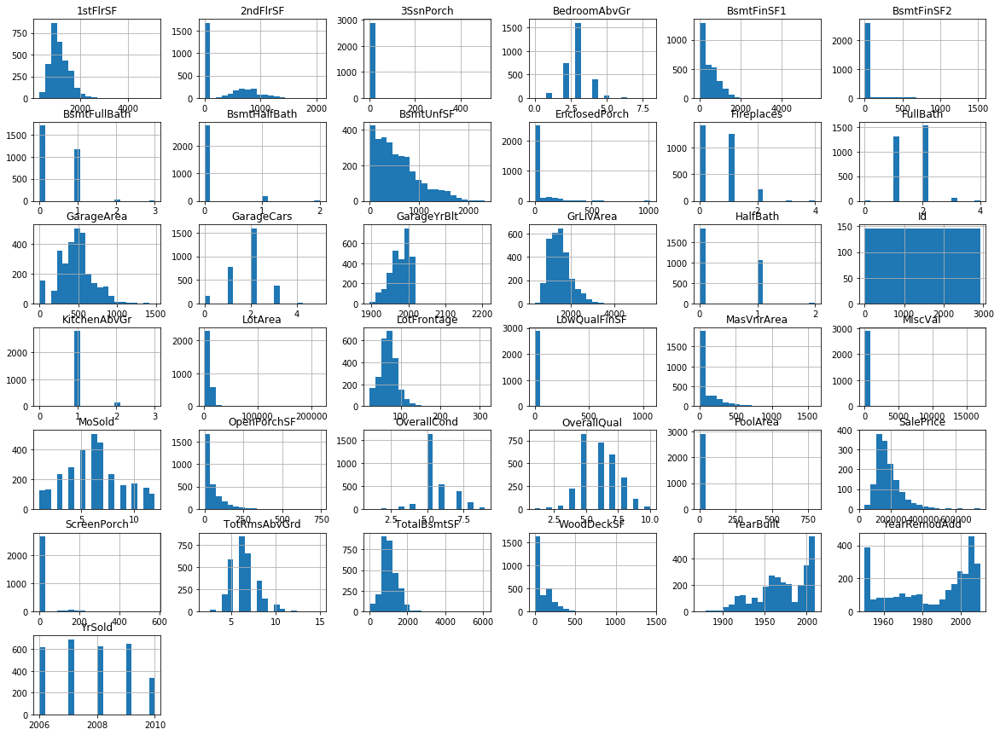

In [62]:
# feature exploration: histogram of all numeric features
_ = df_data.hist(bins=20, figsize=(20, 15))

In [63]:
# feature extraction: sale price
df_data['SalePrice'] = np.log1p(df_data['SalePrice'])

In [64]:
# feature extraction: value of miscellaneous feature
df_data['MiscVal'] = np.log1p(df_data['MiscVal'])

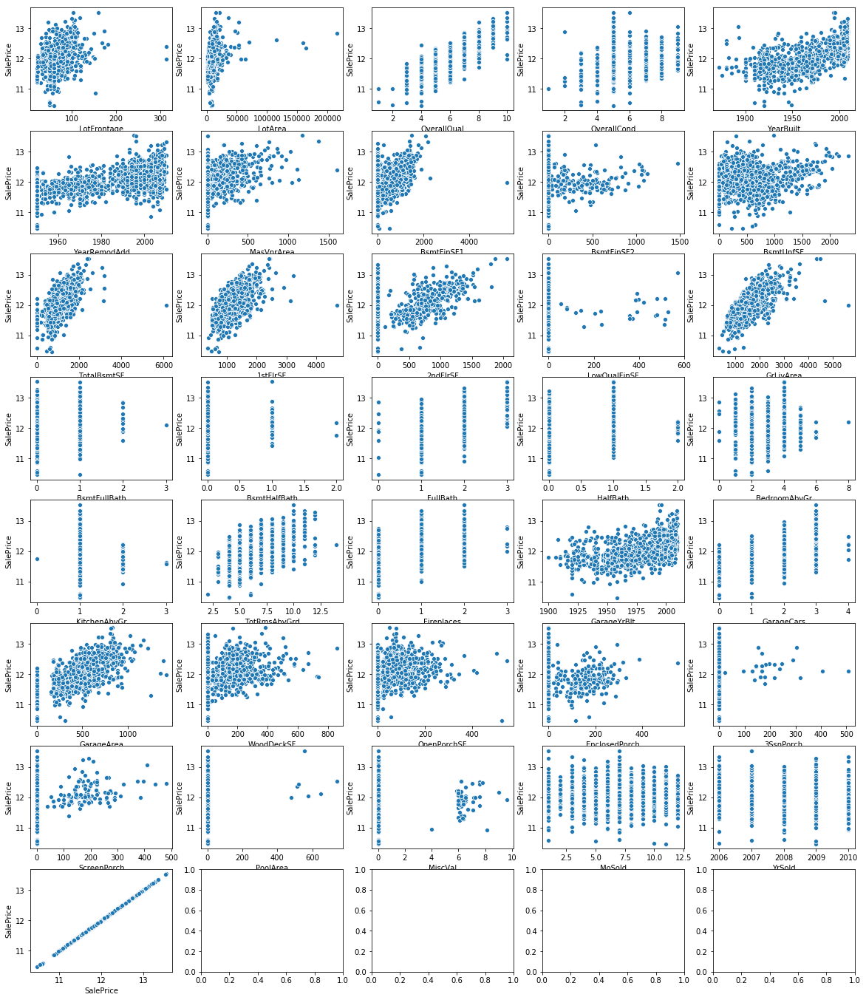

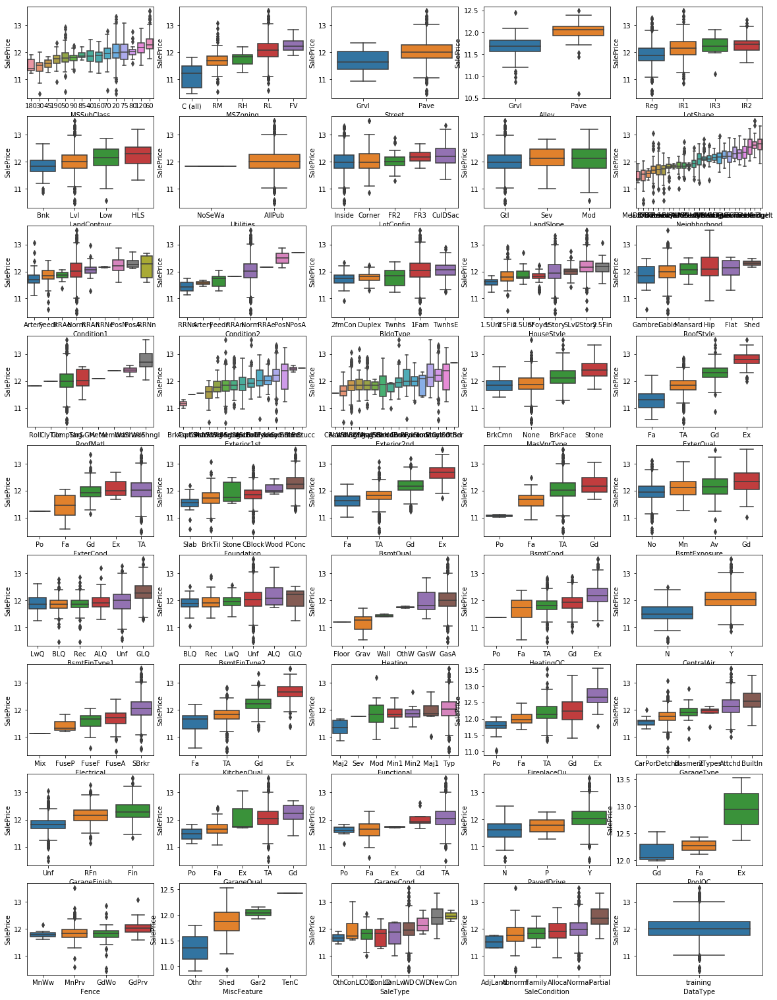

In [65]:
# feature exploration: sale price
col_number = df_data.select_dtypes(include=['number']).columns.drop(['Id']).tolist()
col_object = df_data.select_dtypes(include=['object']).columns.tolist()
scatterplot(x=col_number, y='SalePrice', data=df_data[df_data['DataType'] == 'training'], nrows=(len(col_number) - 1) // 5 + 1)
boxplotsort(cat=col_object, num='SalePrice', data=df_data[df_data['DataType'] == 'training'], nrows=(len(col_object) - 1) // 5 + 1)

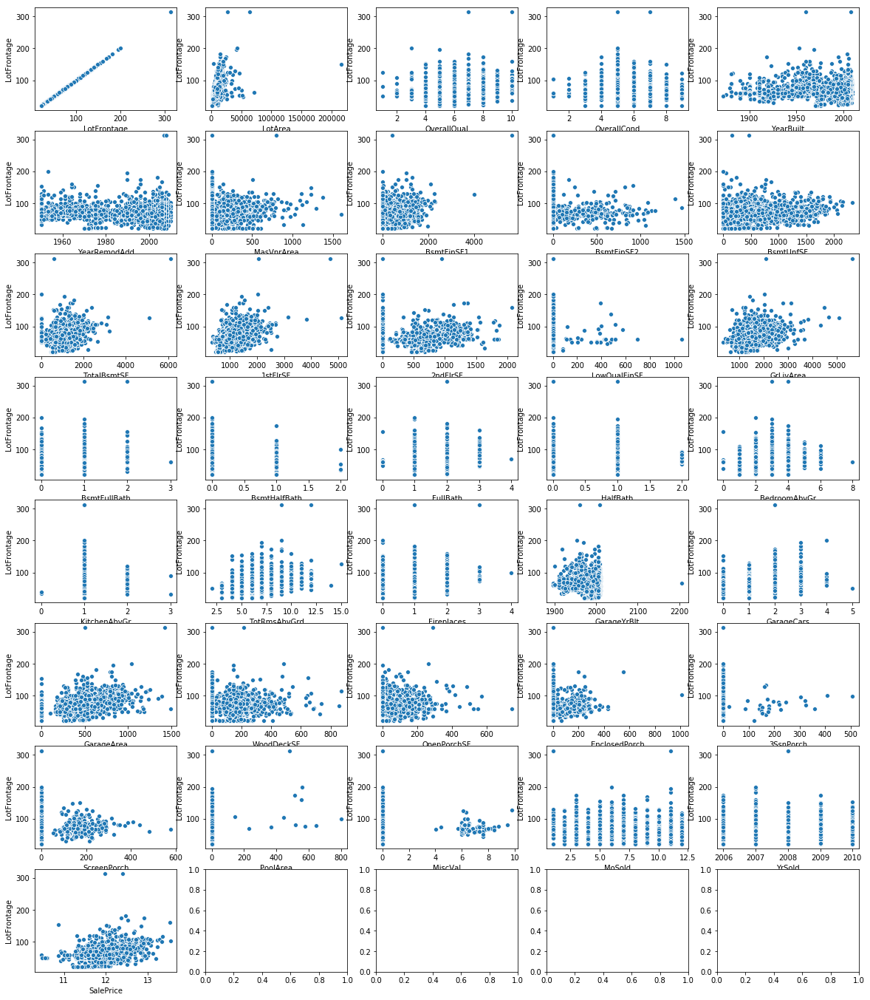

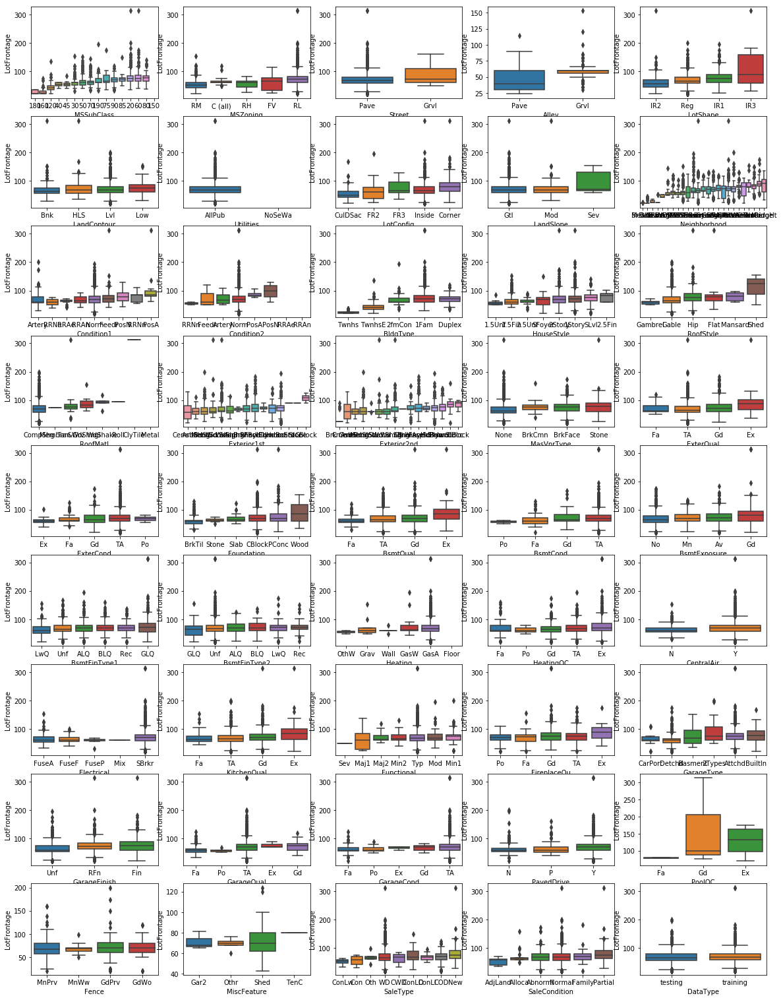

In [66]:
# feature exploration: lot frontage
col_number = df_data.select_dtypes(include=['number']).columns.drop(['Id']).tolist()
col_object = df_data.select_dtypes(include=['object']).columns.tolist()
scatterplot(x=col_number, y='LotFrontage', data=df_data, nrows=(len(col_number) - 1) // 5 + 1)
boxplotsort(cat=col_object, num='LotFrontage', data=df_data, nrows=(len(col_object) - 1) // 5 + 1)

In [67]:
# feature extraction: lot frontage
df_data['LotFrontage'] = df_data['LotFrontage'].fillna(df_data.groupby(['Neighborhood'])['LotFrontage'].transform('mean'))
df_data.loc[(df_data['LotFrontage'] > 200) & (df_data['DataType'] == 'trainnig'), 'DataType'] = 'excluded'

In [68]:
# feature extraction: lot area
df_data.loc[(df_data['LotArea'] > 100000) & (df_data['DataType'] == 'training'), 'DataType'] = 'excluded'

In [69]:
# feature extraction: basement type 1 finished area square feet
df_data.loc[(df_data['BsmtFinSF1'] > 4000) & (df_data['DataType'] == 'training'), 'DataType'] = 'excluded'

In [70]:
# feature extraction: basement total area square feet
df_data.loc[(df_data['TotalBsmtSF'] > 5000) & (df_data['DataType'] == 'training'), 'DataType'] = 'excluded'

In [71]:
# feature extraction: first floor area square feet
df_data.loc[(df_data['1stFlrSF'] > 4000) & (df_data['DataType'] == 'training'), 'DataType'] = 'excluded'

In [72]:
# feature extraction: above grade (ground) living area square feet
df_data.loc[(df_data['GrLivArea'] > 4500) & (df_data['DataType'] == 'training'), 'DataType'] = 'excluded'

In [73]:
# feature extraction: open porch area square feet
df_data.loc[(df_data['OpenPorchSF'] > 500) & (df_data['SalePrice'] < 11) & (df_data['DataType'] == 'training'), 'DataType'] = 'excluded'

In [74]:
# feature extraction: all features related to area
col_convert = ['LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
               '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageArea',
               'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea']
df_data[col_convert] = df_data[col_convert].fillna(0)
df_data['TotalSF'] = df_data['TotalBsmtSF'] + df_data['GrLivArea']
df_data['TotalPorch'] = df_data['OpenPorchSF'] + df_data['EnclosedPorch'] + df_data['3SsnPorch'] + df_data['ScreenPorch']
df_data['TotalArea'] = df_data['TotalSF'] + df_data['TotalPorch'] + df_data['GarageArea'] + df_data['WoodDeckSF']

In [75]:
# feature extraction: all features related to room
col_convert = ['BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
               'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd']
df_data[col_convert] = df_data[col_convert].fillna(0)
df_data['TotalBathBsmt'] = df_data['BsmtFullBath'] + 0.5 * df_data['BsmtHalfBath']
df_data['TotalBathAbvGrd'] = df_data['FullBath'] + 0.5 * df_data['HalfBath']
df_data['TotalRmsAbvGrdIncBath'] = df_data['TotRmsAbvGrd'] + df_data['TotalBathAbvGrd']
df_data['TotalRms'] = df_data['TotalRmsAbvGrdIncBath'] + df_data['TotalBathBsmt']

In [76]:
# feature extraction: total area per rooms
df_data['AreaPerRmsBsmt'] = df_data['TotalBsmtSF'] / (df_data['TotalBathBsmt'] + 1)
df_data['AreaPerRmsGrLivAbvGrd'] = df_data['GrLivArea'] / (df_data['TotalRmsAbvGrdIncBath'] + 1)
df_data['AreaPerRmsTotal'] = df_data['TotalSF'] / (df_data['TotalRms'] + 1)

In [77]:
# feature extraction: all features related to quality and condition
col_convert = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC',
               'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC']
df_data[col_convert] = df_data[col_convert].replace('Ex', 5).replace('Gd', 4).replace('TA', 3).replace('Fa', 2).replace('Po', 1).replace('NA', 0)
df_data[col_convert] = df_data[col_convert].fillna(0).astype(int)
df_data['ExterQualCond'] = df_data['ExterQual'] * df_data['ExterCond']
df_data['BsmtQualCond'] = df_data['BsmtQual'] * df_data['BsmtCond']
df_data['GarageQualCond'] = df_data['GarageQual'] * df_data['GarageCond']
df_data['OverallQualCond'] = df_data['OverallQual'] * df_data['OverallCond']

In [79]:
# feature extraction: all features related to exposure
col_convert = ['BsmtExposure']
df_data[col_convert] = df_data[col_convert].replace('Gd', 4).replace('Av', 3).replace('Mn', 2).replace('No', 1).replace('NA', 0)
df_data[col_convert] = df_data[col_convert].fillna(0).astype(int)

In [80]:
# feature extraction: all features related to basement finished
col_convert = ['BsmtFinType1', 'BsmtFinType2']
df_data[col_convert] = df_data[col_convert].replace('GLQ', 6).replace('ALQ', 5).replace('BLQ', 4).replace('Rec', 3).replace('LwQ', 2).replace('Unf', 1).replace('NA', 0)
df_data[col_convert] = df_data[col_convert].fillna(0).astype(int)

In [81]:
# feature extraction: all features related to garage finished
col_convert = ['GarageFinish']
df_data[col_convert] = df_data[col_convert].replace('Fin', 3).replace('RFn', 2).replace('Unf', 1).replace('NA', 0)
df_data[col_convert] = df_data[col_convert].fillna(0).astype(int)

In [82]:
# feature extraction: all features related to fence
col_convert = ['Fence']
df_data[col_convert] = df_data[col_convert].replace('GdPrv', 4).replace('MnPrv', 3).replace('GdWo', 2).replace('MnWw', 1).replace('NA', 0)
df_data[col_convert] = df_data[col_convert].fillna(0).astype(int)

In [83]:
# feature extraction: all features related to year
df_data['GarageYrBlt'] = df_data['GarageYrBlt'].fillna(df_data['YearBuilt'])
df_data['YearBuiltRemod'] = df_data['YearRemodAdd'] - df_data['YearBuilt']
df_data['YearBuiltSold'] = df_data['YrSold'] - df_data['YearBuilt']
df_data['YearRemodSold'] = df_data['YrSold'] - df_data['YearRemodAdd']
df_data['YearGarageSold'] = df_data['YrSold'] - df_data['GarageYrBlt']

KeyError: 'DataType'

In [85]:
# feature extraction: fillna on type of utilities available
df_data['Utilities'] = df_data['Utilities'].fillna('ELO')

In [86]:
# feature extraction: fillna on type of sale
df_data['SaleType'] = df_data['SaleType'].fillna('Oth')

In [87]:
# feature extraction: fillna with repetitive
col_fillnas = ['MSZoning', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Electrical', 'Functional']
for col_fillna in col_fillnas: df_data[col_fillna] = df_data[col_fillna].fillna(df_data[col_fillna].value_counts().idxmax())

In [88]:
# feature extraction: fillna with na
col_fillnas = ['Alley', 'GarageType']
for col_fillna in col_fillnas: df_data[col_fillna] = df_data[col_fillna].fillna('NA')

In [89]:
# feature extraction: fillna with 0
col_fillnas = ['GarageCars', 'MiscFeature']
df_data[col_fillnas] = df_data[col_fillnas].fillna(0)


In [90]:
# verify and print columns contain nan
if df_data.isna().any().any(): print(df_data.loc[:, df_data.columns[df_data.isna().any()].tolist()].describe(include='all'))
else: print('no null entry')

         SalePrice
count  1460.000000
mean     12.024057
std       0.399449
min      10.460271
25%      11.775105
50%      12.001512
75%      12.273736
max      13.534474


In [91]:
# feature extraction: apply log1p transform for all high skewness numeric features
col_number = df_data.select_dtypes(include=['number']).columns.drop(['MiscVal', 'SalePrice', 'YearBuiltRemod', 'YearBuiltSold', 'YearRemodSold', 'YearGarageSold']).tolist()
for col_transform in col_number:
    skewness = scipy.stats.skew(df_data[col_transform].dropna())
    if skewness > 0.75: df_data[col_transform] = np.log1p(df_data[col_transform])

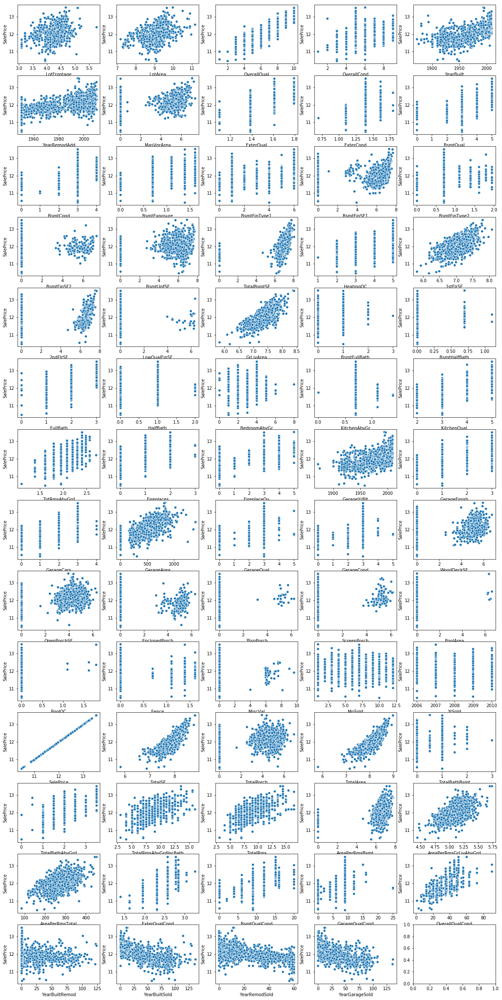

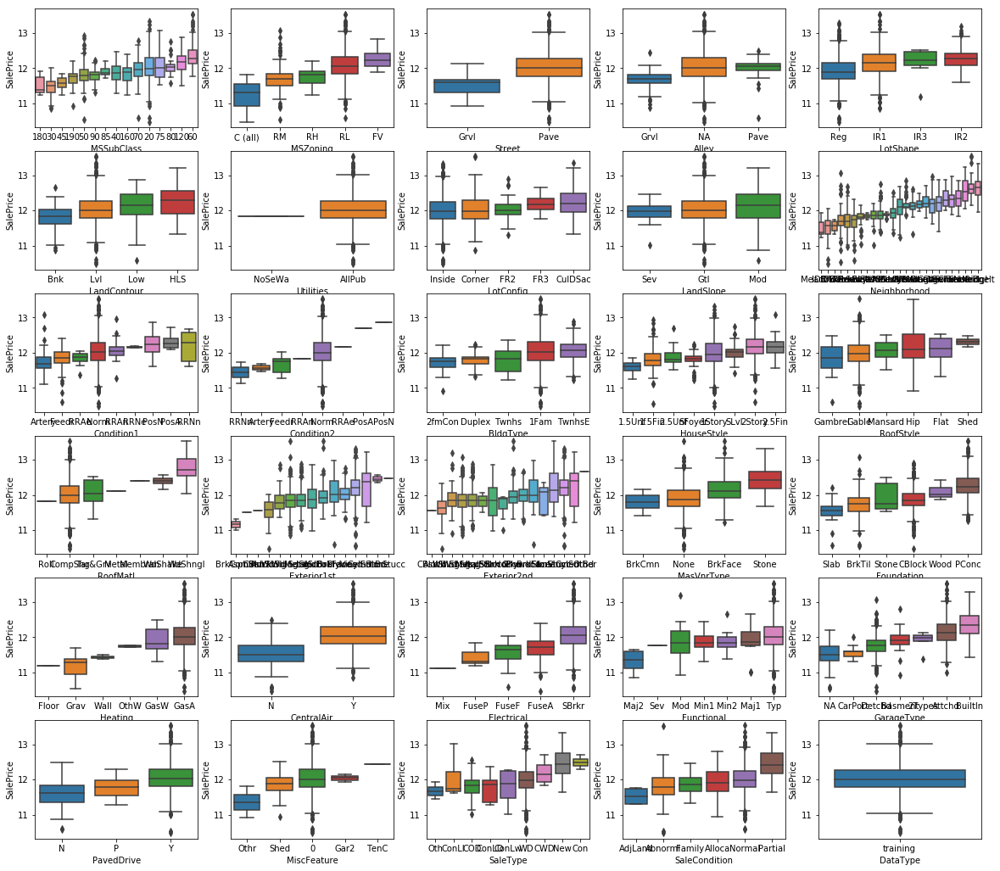

In [92]:
# feature exploration: sale price
col_number = df_data.select_dtypes(include=['number']).columns.drop(['Id']).tolist()
col_object = df_data.select_dtypes(include=['object']).columns.tolist()
scatterplot(x=col_number, y='SalePrice', data=df_data[df_data['DataType'] == 'training'], nrows=(len(col_number) - 1) // 5 + 1)
boxplotsort(cat=col_object, num='SalePrice', data=df_data[df_data['DataType'] == 'training'], nrows=(len(col_object) - 1) // 5 + 1)

In [93]:
# feature extraction: sale price
df_data['SalePrice'] = df_data['SalePrice'].fillna(0)

In [94]:
# convert category codes for data dataframe
df_data = pd.get_dummies(df_data, columns=None, drop_first=True)

In [95]:
# describe data dataframe
df_data.describe(include='all')

,Id,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,DataType_testing,DataType_training
count,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,...,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000
mean,1460.000000,4.212917,9.094915,6.089072,5.564577,1971.312778,1984.264474,2.079239,1.472548,1.403503,...,0.081877,0.002741,0.865022,0.004111,0.008222,0.015759,0.822885,0.083933,0.499829,0.497773
std,842.787043,0.328868,0.509882,1.409947,1.113131,30.291442,20.894344,2.620916,0.127612,0.088748,...,0.274225,0.052289,0.341758,0.063996,0.090317,0.124562,0.381832,0.277335,0.500086,0.500081
min,1.000000,3.091042,7.170888,1.000000,1.000000,1872.000000,1950.000000,0.000000,1.098612,0.693147,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,730.500000,4.110874,8.919854,5.000000,5.000000,1953.500000,1965.000000,0.000000,1.386294,1.386294,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,1460.000000,4.262680,9.154193,6.000000,5.000000,1973.000000,1993.000000,0.000000,1.386294,1.386294,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,2189.500000,4.394449,9.356257,7.000000,6.000000,2001.000000,2004.000000,5.102906,1.609438,1.386294,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
max,2919.000000,5.749393,12.279537,10.000000,9.000000,2010.000000,2010.000000,7.378384,1.791759,1.791759,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [96]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Columns: 248 entries, Id to DataType_training
dtypes: float64(44), int64(26), uint8(178)
memory usage: 2.1 MB


In [97]:
# compute pairwise correlation of columns, excluding NA/null values and present through heat map
corr = df_data[df_data['DataType_training'] == 1].corr()
fig, axes = plt.subplots(figsize=(200, 150))
heatmap = sns.heatmap(corr, annot=True, cmap=plt.cm.RdBu, fmt='.1f', square=True, vmin=-0.8, vmax=0.8)

In [98]:
# select all features to evaluate the feature importances
x = df_data[df_data['DataType_training'] == 1].drop(['Id', 'SalePrice', 'DataType_training', 'DataType_testing'], axis=1)
y = df_data.loc[df_data['DataType_training'] == 1, 'SalePrice']

In [99]:
lassoreg = Lasso(alpha=1e-5).fit(x, y)
feat = pd.DataFrame(data=lassoreg.coef_, index=x.columns, columns=['FeatureImportances']).sort_values(['FeatureImportances'], ascending=False)

/Applications/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


In [100]:
# plot the feature importances
feat[(feat['FeatureImportances'] < -1e-3) | (feat['FeatureImportances'] > 1e-3)].dropna().plot(y='FeatureImportances', figsize=(20, 5), kind='bar')
plt.axhline(-0.005, color="grey")
plt.axhline(0.005, color="grey"

SyntaxError: unexpected EOF while parsing (<ipython-input-100-4fb07fb36c85>, line 4)

In [ ]:
model_feat = feat[(feat['FeatureImportances'] < -0.005) | (feat['FeatureImportances'] > 0.005)].index

In [ ]:
# select the important features
x = df_data.loc[df_data['DataType_training'] == 1, model_feat]
y = df_data.loc[df_data['DataType_training'] == 1, 'SalePrice']

In [ ]:
# create scaler to the features
scaler = RobustScaler()
x = scaler.fit_transform(x)

In [ ]:
# perform train-test (validate) split
x_train, x_validate, y_train, y_validate = train_test_split(x, y, random_state=58, test_size=0.25)

In [ ]:
# linear regression model setup
model_linreg = LinearRegression()

# linear regression model fit
model_linreg.fit(x_train, y_train)

# linear regression model prediction
model_linreg_ypredict = model_linreg.predict(x_validate)

# linear regression model metrics
model_linreg_mse = mean_squared_error(y_validate, model_linreg_ypredict) ** 0.5
model_linreg_cvscores = np.sqrt(np.abs(cross_val_score(model_linreg, x, y, cv=5, scoring='neg_mean_squared_error')))
print('linear regression\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_linreg_mse, model_linreg_cvscores.mean(), 2 * model_linreg_cvscores.std()))

In [ ]:
# lasso regression model setup
model_lassoreg = Lasso(alpha=0.001)

# lasso regression model fit
model_lassoreg.fit(x_train, y_train)

# lasso regression model prediction
model_lassoreg_ypredict = model_lassoreg.predict(x_validate)

# lasso regression model metrics
model_lassoreg_mse = mean_squared_error(y_validate, model_lassoreg_ypredict) ** 0.5
model_lassoreg_cvscores = np.sqrt(np.abs(cross_val_score(model_lassoreg, x, y, cv=5, scoring='neg_mean_squared_error')))
print('lasso regression\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_lassoreg_mse, model_lassoreg_cvscores.mean(), 2 * model_lassoreg_cvscores.std()))

In [ ]:
# specify the hyperparameter space
params = {'alpha': np.logspace(-4, 4, base=10, num=9)}

# lasso regression grid search model setup
model_lassoreg_cv = GridSearchCV(model_lassoreg, params, cv=5)

# lasso regression grid search model fit
model_lassoreg_cv.fit(x_train, y_train)

# lasso regression grid search model prediction
model_lassoreg_cv_ypredict = model_lassoreg_cv.predict(x_validate)

# lasso regression grid search model metrics
model_lassoreg_cv_mse = mean_squared_error(y_validate, model_lassoreg_cv_ypredict) ** 0.5
model_lassoreg_cv_cvscores = np.sqrt(np.abs(cross_val_score(model_lassoreg_cv, x, y, cv=5, scoring='neg_mean_squared_error')))
print('lasso regression grid search\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_lassoreg_cv_mse, model_lassoreg_cv_cvscores.mean(), 2 * model_lassoreg_cv_cvscores.std()))
print('  best parameters: %s' %model_lassoreg_cv.best_params_)


In [ ]:
# ridge regression model setup
model_ridgereg = Ridge(alpha=10)

# ridge regression model fit
model_ridgereg.fit(x_train, y_train)

# ridge regression model prediction
model_ridgereg_ypredict = model_ridgereg.predict(x_validate)

# ridge regression model metrics
model_ridgereg_mse = mean_squared_error(y_validate, model_ridgereg_ypredict) ** 0.5
model_ridgereg_cvscores = np.sqrt(np.abs(cross_val_score(model_ridgereg, x, y, cv=5, scoring='neg_mean_squared_error')))
print('ridge regression\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_ridgereg_mse, model_ridgereg_cvscores.mean(), 2 * model_ridgereg_cvscores.std()))

In [ ]:
# specify the hyperparameter space
params = {'alpha': np.logspace(-4, 4, base=10, num=9)}

# ridge regression grid search model setup
model_ridgereg_cv = GridSearchCV(model_ridgereg, params, cv=5)

# ridge regression grid search model fit
model_ridgereg_cv.fit(x_train, y_train)

# ridge regression grid search model prediction
model_ridgereg_cv_ypredict = model_ridgereg_cv.predict(x_validate)

# ridge regression grid search model metrics
model_ridgereg_cv_mse = mean_squared_error(y_validate, model_ridgereg_cv_ypredict) ** 0.5
model_ridgereg_cv_cvscores = np.sqrt(np.abs(cross_val_score(model_ridgereg_cv, x, y, cv=5, scoring='neg_mean_squared_error')))
print('ridge regression grid search\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_ridgereg_cv_mse, model_ridgereg_cv_cvscores.mean(), 2 * model_ridgereg_cv_cvscores.std()))
print('  best parameters: %s' %model_ridgereg_cv.best_params_)

In [ ]:
# elastic net regression model setup
model_elasticnetreg = ElasticNet(alpha=0.1, l1_ratio=0.1)

# elastic net regression model fit
model_elasticnetreg.fit(x_train, y_train)

# elastic net regression model prediction
model_elasticnetreg_ypredict = model_elasticnetreg.predict(x_validate)

# elastic net regression model metrics
model_elasticnetreg_mse = mean_squared_error(y_validate, model_elasticnetreg_ypredict) ** 0.5
model_elasticnetreg_cvscores = np.sqrt(np.abs(cross_val_score(model_elasticnetreg, x, y, cv=5, scoring='neg_mean_squared_error')))
print('elastic net regression\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_elasticnetreg_mse, model_elasticnetreg_cvscores.mean(), 2 * model_elasticnetreg_cvscores.std()))

In [ ]:
# specify the hyperparameter space
params = {'alpha': np.logspace(-4, 4, base=10, num=9),
          'l1_ratio': np.linspace(0.1, 0.9, num=5),
}

# elastic net regression grid search model setup
model_elasticnetreg_cv = GridSearchCV(model_elasticnetreg, params, cv=5)

# elastic net regression grid search model fit
model_elasticnetreg_cv.fit(x_train, y_train)

# elastic net regression grid search model prediction
model_elasticnetreg_cv_ypredict = model_elasticnetreg_cv.predict(x_validate)

# elastic net regression grid search model metrics
model_elasticnetreg_cv_mse = mean_squared_error(y_validate, model_elasticnetreg_cv_ypredict) ** 0.5
model_elasticnetreg_cv_cvscores = np.sqrt(np.abs(cross_val_score(model_elasticnetreg_cv, x, y, cv=5, scoring='neg_mean_squared_error')))
print('elastic net regression grid search\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_elasticnetreg_cv_mse, model_elasticnetreg_cv_cvscores.mean(), 2 * model_elasticnetreg_cv_cvscores.std()))
print('  best parameters: %s' %model_elasticnetreg_cv.best_params_)

In [ ]:
# kernel ridge regression model setup
model_kernelridgereg = KernelRidge(alpha=0.1, degree=2, kernel='polynomial')

# kernel ridge regression model fit
model_kernelridgereg.fit(x_train, y_train)

# kernel ridge regression model prediction
model_kernelridgereg_ypredict = model_kernelridgereg.predict(x_validate)

# kernel ridge regression model metrics
model_kernelridgereg_mse = mean_squared_error(y_validate, model_kernelridgereg_ypredict) ** 0.5
model_kernelridgereg_cvscores = np.sqrt(np.abs(cross_val_score(model_kernelridgereg, x, y, cv=5, scoring='neg_mean_squared_error')))
print('kernel ridge regression\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_kernelridgereg_mse, model_kernelridgereg_cvscores.mean(), 2 * model_kernelridgereg_cvscores.std()))

In [ ]:
# specify the hyperparameter space
params = {'alpha': np.logspace(-4, 4, base=10, num=9),
          'degree': [1, 2, 3, 4, 5],
}

# kernel ridge regression grid search model setup
model_kernelridgereg_cv = GridSearchCV(model_kernelridgereg, params, cv=5)

# kernel ridge regression grid search model fit
model_kernelridgereg_cv.fit(x_train, y_train)

# kernel ridge regression grid search model prediction
model_kernelridgereg_cv_ypredict = model_kernelridgereg_cv.predict(x_validate)

# kernel ridge regression grid search model metrics
model_kernelridgereg_cv_mse = mean_squared_error(y_validate, model_kernelridgereg_cv_ypredict) ** 0.5
model_kernelridgereg_cv_cvscores = np.sqrt(np.abs(cross_val_score(model_kernelridgereg_cv, x, y, cv=5, scoring='neg_mean_squared_error')))
print('kernel ridge regression grid search\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_kernelridgereg_cv_mse, model_kernelridgereg_cv_cvscores.mean(), 2 * model_kernelridgereg_cv_cvscores.std()))
print('  best parameters: %s' %model_kernelridgereg_cv.best_params_)

In [ ]:
# decision tree regression model setup
model_treereg = DecisionTreeRegressor(splitter='best', min_samples_split=5)

# decision tree regression model fit
model_treereg.fit(x_train, y_train)

# decision tree regression model prediction
model_treereg_ypredict = model_treereg.predict(x_validate)

# decision tree regression model metrics
model_treereg_mse = mean_squared_error(y_validate, model_treereg_ypredict) ** 0.5
model_treereg_cvscores = np.sqrt(np.abs(cross_val_score(model_treereg, x, y, cv=5, scoring='neg_mean_squared_error')))
print('decision tree regression\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_treereg_mse, model_treereg_cvscores.mean(), 2 * model_treereg_cvscores.std()))

In [ ]:
 random forest regression model setup
model_forestreg = RandomForestRegressor(n_estimators=100, min_samples_split=5, random_state=58)

# random forest regression model fit
model_forestreg.fit(x_train, y_train)

# random forest regression model prediction
model_forestreg_ypredict = model_forestreg.predict(x_validate)

# random forest regression model metrics
model_forestreg_mse = mean_squared_error(y_validate, model_forestreg_ypredict) ** 0.5
model_forestreg_cvscores = np.sqrt(np.abs(cross_val_score(model_forestreg, x, y, cv=5, scoring='neg_mean_squared_error')))
print('random forest regression\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_forestreg_mse, model_forestreg_cvscores.mean(), 2 * model_forestreg_cvscores.std()))

In [ ]:
# specify the hyperparameter space
params = {'n_estimators': [100],
          'max_depth': [10, 20, None],
          'min_samples_split': [3, 5, 7, 9],
          'random_state': [58],
}

# random forest regression grid search model setup
model_forestreg_cv = GridSearchCV(model_forestreg, params, cv=5)

# random forest regression grid search model fit
model_forestreg_cv.fit(x_train, y_train)

# random forest regression grid search model prediction
model_forestreg_cv_ypredict = model_forestreg_cv.predict(x_validate)

# random forest regression grid search model metrics
model_forestreg_cv_mse = mean_squared_error(y_validate, model_forestreg_cv_ypredict) ** 0.5
model_forestreg_cv_cvscores = np.sqrt(np.abs(cross_val_score(model_forestreg_cv, x, y, cv=5, scoring='neg_mean_squared_error')))
print('random forest regression grid search\n  root mean squared error: %0.4f, cross validation score: %0.4f (+/- %0.4f)' %(model_forestreg_cv_mse, model_forestreg_cv_cvscores.mean(), 2 * model_forestreg_cv_cvscores.std()))
print('  best parameters: %s' %model_forestreg_cv.best_params_)

In [ ]:
# model selection
final_model = model_kernelridgereg

# prepare testing data and compute the observed value
x_test = df_data.loc[df_data['DataType_testing'] == 1, model_feat]
x_test = scaler.transform(x_test)
y_test = pd.DataFrame(final_model.predict(x_test),
                      columns=['SalePrice'], index=df_data.loc[df_data['DataType_testing'] == 1, 'Id'])
y_test['SalePrice'] = np.expm1(y_test['SalePrice'])

In [ ]:
# summit the results
out = pd.DataFrame({'Id': y_test.index, 'SalePrice': y_test['SalePrice']})
out.to_csv('submission.csv', index=False)